# Gradient verification for the 2D diffusion case

- Importation of the required modules

In [1]:
import os
from pathlib import Path
import logging
import copy
import time
from typing import Dict, Iterable, Type
import pyrtid
import pyrtid.forward as dmfwd
import pyrtid.inverse as dminv
import nested_grid_plotter as ngp
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection
from matplotlib.animation import HTMLWriter
from matplotlib.colors import LogNorm
from IPython.display import HTML
import numpy as np

import pandas as pd
import scipy as sp
import gstools as gs

gs.config.USE_RUST = True  # Use the rust implementation of gstools

- Set-up logging level

In [3]:
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.info("this is a logging test")

INFO:root:this is a logging test


- Check package/software versions

In [ ]:
pyrtid.utils.show_versions()

- Create a directory to store the exported figures

In [5]:
ipynb_path = os.path.dirname(os.path.realpath("__file__"))
fig_save_path = Path(ipynb_path, "exported_figures")
fig_save_path.mkdir(parents=True, exist_ok=True)  # make sure that the directory exists

- Define some configurations for the plots

In [6]:
# Some configs for the plots
new_rc_params = {
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "DejaVu Sans"],
    "font.size": 16,
    "text.usetex": False,
    "savefig.format": "svg",
    "svg.fonttype": "none",  # to store text as text, not as path
    "savefig.facecolor": "w",
    "savefig.edgecolor": "k",
    "savefig.dpi": 300,
    "figure.constrained_layout.use": True,
    "figure.facecolor": "w",
    "axes.facecolor": "w",
}
csfont = {"fontname": "Comic Sans MS"}
hfont = {"fontname": "Helvetica"}
plt.plot()
plt.close()  # required for the plot to update
plt.rcParams.update(new_rc_params)

- Create a directory to store the exported figures

In [7]:
ipynb_path = os.path.dirname(os.path.realpath("__file__"))
fig_save_path = Path(ipynb_path, "exported_figures")
fig_save_path.mkdir(parents=True, exist_ok=True)  # make sure that the directory exists

- Define some configurations for the plots

In [8]:
# Some configs for the plots
new_rc_params = {
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "DejaVu Sans"],
    "font.size": 16,
    "text.usetex": False,
    "savefig.format": "svg",
    "svg.fonttype": "none",  # to store text as text, not as path
    "savefig.facecolor": "w",
    "savefig.edgecolor": "k",
    "savefig.dpi": 300,
    "figure.constrained_layout.use": True,
    "figure.facecolor": "w",
    "axes.facecolor": "w",
}
csfont = {"fontname": "Comic Sans MS"}
hfont = {"fontname": "Helvetica"}
plt.rcParams.update(new_rc_params)

## Forward problem

- Define a very simple pure diffusion case in 1D.

In [9]:
nx = 17  # number of voxels along the x axis
ny = 15  # number of voxels along the y axis
dx = 8.45  # voxel dimension along the x axis
dy = 9.33  # voxel dimension along the y axis
nt = 10  # number of time steps
dt = 4000.0  # timestep in seconds
conc_min = 0  # general initial cocentration
conc_max = 1e-4
D0 = 1e-4  # general initial diffusion coefficient
w0 = 0.23  # general porosity
k0 = 1e-3  # general permeability (m/s)
crank_nicolson_diffusion = 0.5

- Create an initial gaussian spatial distribution for the diffusion

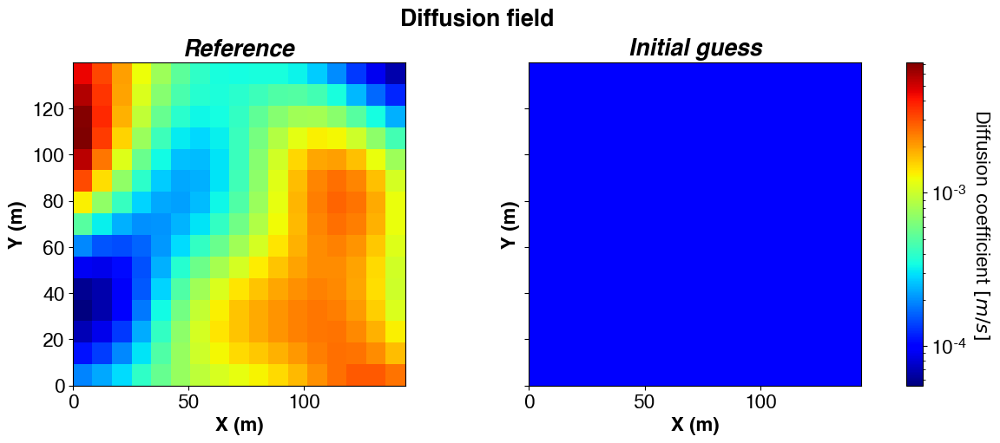

In [10]:
# Create a Gaussian Covariance Model just for the example
# To vary the results, change the seed :)
seed = 199653

# Log-noramlized cov model
min_val = 0.0
max_val = 2e-3
# Compute the mean and the standard deviation of the desired log-normal distribution.
meanlog = (max_val + min_val) / 2
stdevlog = max_val - min_val  # std
mean = get_normalized_mean_from_lognormal_params(meanlog, stdevlog)
stdev = get_normalized_std_from_lognormal_params(meanlog, stdevlog)

diffusion_reference = gen_random_ensemble(
    model=gs.Gaussian,
    n_ensemble=1,
    var=stdev**2,
    len_scale=5,
    mean=mean,
    nx=nx,
    ny=ny,
    seed=seed,
    normalizer=gs.normalizer.LogNormal,
).reshape(nx, ny)

# Initial estimate = an homogeneous value
diffusion_estimate = np.ones((nx, ny)) * 1e-4

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)
ngp.multi_imshow(
    plotter.axes,
    plotter.fig,
    data={"Reference": diffusion_reference, "Initial guess": diffusion_estimate},
    cbar_title="Diffusion coefficient $[m/s]$",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "norm": LogNorm(),
        "extent": (0.0, nx * dx, 0.0, ny * dy),
        "aspect": "equal",
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)
plotter.subfigs["fig0"].suptitle("Diffusion field", fontweight="bold")

fname = "Diffusion_field_reference_vs_initial_guess"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- The initial concentration is the same in both cases and has a circular shape

In [11]:
def create_circular_mask(
    nx: int, ny: int, dx: float = 1.0, dy: float = 1.0, center=None, radius=None
) -> npt.NDArray[np.bool_]:
    if center is None:  # use the middle of the image
        center = (nx * dx / 2, ny * dy / 2)
    if radius is None:  # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], nx * dx - center[0], ny * dy - center[1])

    X, Y = np.ogrid[:nx, :ny]
    X = (X + 0.5) * dx
    Y = (Y + 0.5) * dy
    dist_from_center = np.sqrt((X - center[0]) ** 2 + (Y - center[1]) ** 2)
    mask = dist_from_center <= radius
    return mask


init_conc = np.zeros((nx, ny))
init_conc[
    create_circular_mask(nx, ny, dx=dx, dy=dy, radius=6.2 * dx)
] = conc_max  # [mol/kg]

- Define some observation wells

In [12]:
# locations in the grid
obs_grid_locations = np.array(
    [(12, 4), (12, 10), (4, 4), (8, 7), (4, 10), (8, 2), (8, 12)]
)
# locations in the plots
obs_plot_locations = np.array([(2, 3), (1, 3), (2, 1), (2, 2), (1, 1), (3, 2), (1, 2)])

In [13]:
# observation_locations = np.array([[6, 4], [10, 4], [10, 10], [6, 10]])

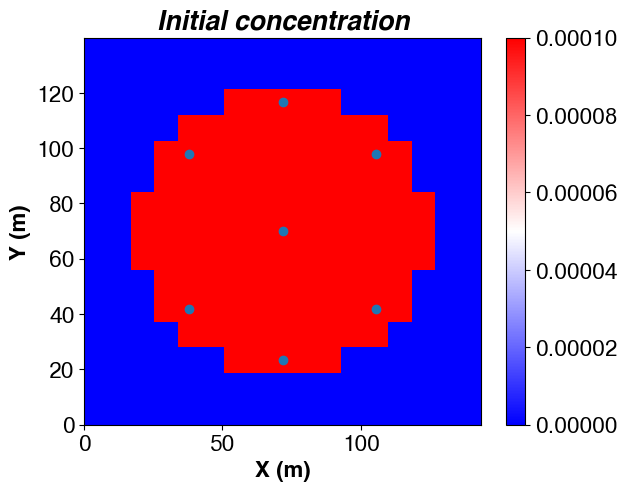

In [14]:
plotter = ngp.NestedGridPlotter()
ngp.multi_imshow(
    plotter.axes,
    plotter.fig,
    data={"Initial concentration": init_conc},
    xlabel="X [m]",
    ylabel="Y [m]",
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)
plotter.axes[0].plot(
    obs_grid_locations.T[0] * dx + dx / 2,
    obs_grid_locations.T[1] * dy + dy / 2,
    marker="o",
    linestyle="none",
)

### Forward problem in demonstrator

In [15]:
time_params = dmfwd.TimeParameters(
    duration=duration_in_s, dt_init=dt_init, dt_max=dt_max, dt_min=dt_min
)
geometry = dmfwd.Geometry(nx=nx, ny=ny, dx=dx, dy=dy)
fl_params = dmfwd.FlowParameters()
tr_params = dmfwd.TransportParameters(
    diffusion=D0, porosity=w0, crank_nicolson_diffusion=crank_nicolson_diffusion
)
gch_params = dmfwd.GeochemicalParameters(conc=conc_min, grade=0.0)


# We define a function to easily generate a model.
def create_base_model() -> dmfwd.ForwardModel:
    return dmfwd.ForwardModel(geometry, time_params, fl_params, tr_params, gch_params)

- Create two models

In [16]:
diffusion_reference.shape

(17, 15)

In [17]:
model_reference = create_base_model()
model_estimate = create_base_model()
# Exact diffusion
model_reference.tr_model.diffusion[:, :] = diffusion_reference
# Estimated diffusion
model_estimate.tr_model.diffusion[:, :] = diffusion_estimate

model_reference.tr_model.set_initial_conc(init_conc)
model_estimate.tr_model.set_initial_conc(init_conc)

- Run the models

In [18]:
solver_reference = dmfwd.ForwardSolver(model_reference)
solver_reference.solve()

solver_estimate = dmfwd.ForwardSolver(model_estimate)
solver_estimate.solve()

### Forward problem definition in HYTEC

- Define a runner

In [19]:
if runner_type == RunnerType.FRONTAL:
    runner = FrontalHytecRunner(
        hytec_binary_path_or_alias=hytec_binary_path_or_alias,
        mpi_binary_path_or_alias=mpi_binary_path_or_alias,
        nb_cpu=4,
        freq_checks_is_simu_over_sec=5,
    )
elif runner_type == RunnerType.SLURM:
    job_config = JobConfig(
        hytec_binary_path_or_alias=hytec_binary_path_or_alias,
        nb_nodes=1,
        ncpus=4,
        queue="geo-cpu",
        mpi_binary_path_or_alias=mpi_binary_path_or_alias,
        dos2unix_binary_path_or_alias=dos2unix_binary_path_or_alias,
    )
    runner = SlurmHytecRunner(
        job_config=job_config,
        freq_checks_is_simu_over_sec=5,
    )
elif runner_type == RunnerType.QSUB:
    job_config = JobConfig(
        hytec_binary_path_or_alias=hytec_binary_path_or_alias,
        nb_nodes=1,
        ncpus=4,
        queue="Omines_cpu",
        mpi_binary_path_or_alias=mpi_binary_path_or_alias,
        dos2unix_binary_path_or_alias=dos2unix_binary_path_or_alias,
    )
    runner = QsubHytecRunner(
        job_config=job_config,
        freq_checks_is_simu_over_sec=5,
    )
else:
    raise Exception("Could not created runner")

- Create an empty simulation in a non existing folder

In [20]:
simu_base = HytecSimulation("simu_base", Path.cwd().joinpath("simu_base"))

- Add a TDB file

In [21]:
simu_base.link_tdb("./../../../../TDB/chess.tdb")  # This is relative to the htc file

- Define the output format

In [22]:
simu_base.model.add_sub_item(hymd.OutputFormat("vtk"))

- Hydrodynamic model and its parameters definition

In [23]:
hmodel = hymd.HydrodynamicModel()
hmodel.add_sub_item(hymd.FlowRegime("stationary"))
hmodel.add_sub_item(hymd.Porosity(w0))
hmodel.add_sub_item(hymd.Permeability(k0, units="m/s"))
hmodel.add_sub_item(hymd.DiffusionCoefficient(D0, units="m2/s"))
hmodel.add_sub_item(hymd.Head(0.0, "m"))
hmodel.add_sub_item(hymd.DiffusionCrankNicolson(crank_nicolson_diffusion))
simu_base.model.add_sub_item(hmodel)

- Geochemical unit definition

In [24]:
chmodel = hymd.GeochemicalModel(hymd.Report("full"), hymd.Redox("disabled"))
# Define a geochem units
base_unit = hymd.GeochemicalUnit("chem_base")
high_conc_unit = hymd.GeochemicalUnit("chem_high_conc")
species = "T"
# Set concentrations
base_unit.add_sub_item(hymd.Concentration(species, conc_min, units="molal"))
high_conc_unit.add_sub_item(hymd.Concentration(species, conc_max, units="molal"))
# define tracer
chmodel.add_sub_item(hymd.Define("basis", species))

# exclude
chmodel.add_sub_item(hymd.Exclude(("minerals", "colloids", "gases")))

# Add the units to the geochemical model
chmodel.add_sub_item(base_unit)
chmodel.add_sub_item(high_conc_unit)

# Add to the main model
simu_base.model.add_sub_item(chmodel)

- Geometry definition

In [25]:
gmodel = hymd.GeometryModel(
    hymd.GridRegime("rectangle"), hymd.Domain(f"{nx*dx},{nx} {ny*dy},{ny}")
)
zone_domain = hymd.Zone(
    "domain", hymd.Geometry("domain"), hymd.Geochemistry(base_unit.name)
)

zone_high_conc = hymd.Zone(
    "zone_high_conc",
    hymd.Geometry(f"circle {(nx / 2) * dx}, {(ny / 2) * dy} {6.2 * dx} m"),
    hymd.Geochemistry(high_conc_unit.name),
)
gmodel.add_sub_item(zone_domain)
gmodel.add_sub_item(zone_high_conc)
simu_base.model.add_sub_item(gmodel)

- Boundary model definition

In [26]:
# Boundary conditions
flc = hymd.FlowCondition("constant-head at 0 m")
# tc = hymd.TransportCondition("zero-conc-gradient")
bmodel = hymd.BoundaryModel(
    hymd.Boundary(
        "border_left",
        hymd.Coordinates(f"0,0, 0,{ny*dy}", units="m"),
        flc,
    ),
    hymd.Boundary(
        "border_top",
        hymd.Coordinates(f"0,{ny*dy}, {nx*dx},{ny*dy}", units="m"),
        flc,
    ),
    hymd.Boundary(
        "border_right", hymd.Coordinates(f"{nx*dx},{ny*dy}, {nx*dx},0", units="m"), flc
    ),
    hymd.Boundary(
        "border_bottom",
        hymd.Coordinates(f"0,0, {nx*dx},0", units="m"),
        flc,
    ),
)
simu_base.model.add_sub_item(bmodel)

- Time discretization

In [27]:
tmodel = hymd.TimeDiscretizationModel(
    hymd.Duration(nt * dt, units="s"),
    hymd.TimeStep(
        hymd.Variable(
            hymd.StartValue(dt, "s"), hymd.Maximum(dt, "s"), hymd.CourantFactor(20.0)
        ),
    ),
)
simu_base.model.add_sub_item(tmodel)

- Sampling definition

In [28]:
smodel = hymd.SamplingModel(
    hymd.GridSampling(nt),
    hymd.Select("time", units="s"),
    hymd.Select("node-number"),
    hymd.Select("diffusion", units="m2/s"),
    hymd.Select(species, units="mol/kg"),
)
simu_base.model.add_sub_item(smodel)

- Create two models from this base simulation

In [29]:
simu_reference = copy.deepcopy(simu_base)
simu_reference.update_root_and_name(
    new_root="simu_reference", new_name="simu_reference"
)
simu_estimate = copy.deepcopy(simu_base)
simu_estimate.update_root_and_name(new_root="simu_estimate", new_name="simu_estimate")

- Add the diffusion fields to the simulations

In [30]:
index: NDArrayFloat = np.arange(nx * ny)

# Reference
data_reference = pd.DataFrame(
    data={
        "node-number": index,
        # x and y are cell centers
        "x": (index % nx) * dx + dx / 2,
        "y": sorted((index % ny) * dy + dy / 2),
        "porosity": 1.0,
        "diffusion": diffusion_reference.ravel("F"),
    },  # need to flatten the parameter
    index=index,
)
simu_reference.add_param_file_data(ParameterFiles.HYDRO, data_reference)

# Estimated
data_estimate = pd.DataFrame(
    data={
        "node-number": index,
        # x and y are cell centers
        "x": (index % nx) * dx + dx / 2,
        "y": sorted((index % ny) * dy + dy / 2),
        "porosity": 1.0,
        "diffusion": diffusion_estimate.ravel("F"),
    },  # need to flatten the parameter
    index=index,
)
simu_estimate.add_param_file_data(ParameterFiles.HYDRO, data_estimate)

- Checking the hydro parameters have been correctly set-up

In [31]:
simu_reference.handlers.hydro.data

,node-number,x,y,porosity,diffusion
0,0,4.225,4.665,1.0,0.000189
1,1,12.675,4.665,1.0,0.000226
2,2,21.125,4.665,1.0,0.000292
3,3,29.575,4.665,1.0,0.000398
4,4,38.025,4.665,1.0,0.000549
...,...,...,...,...,...
250,250,105.625,135.285,1.0,0.000269
251,251,114.075,135.285,1.0,0.000196
252,252,122.525,135.285,1.0,0.000132
253,253,130.975,135.285,1.0,0.000089


In [32]:
simu_estimate.handlers.hydro.data

,node-number,x,y,porosity,diffusion
0,0,4.225,4.665,1.0,0.0001
1,1,12.675,4.665,1.0,0.0001
2,2,21.125,4.665,1.0,0.0001
3,3,29.575,4.665,1.0,0.0001
4,4,38.025,4.665,1.0,0.0001
...,...,...,...,...,...
250,250,105.625,135.285,1.0,0.0001
251,251,114.075,135.285,1.0,0.0001
252,252,122.525,135.285,1.0,0.0001
253,253,130.975,135.285,1.0,0.0001


In [33]:
simu_reference.write_input_files()
simu_estimate.write_input_files()
runner.run(simu_reference)
runner.run(simu_estimate)

INFO:root:The job is over ! Elapsed time = 0:00:00.142054
INFO:root:The job is over ! Elapsed time = 0:00:00.134563


True

# Comparison between hytec and the demonstrator for the forward problem

- Reading the results and displaying available fields

In [34]:
simu_reference.read_hytec_results()
simu_reference.handlers.results.grid_res_columns

['timestep',
 'Zones',
 'time [s]',
 'node-number []',
 'diffusion [m2/s]',
 'T [mol/kg]',
 'x-distance',
 'y-distance']

In [35]:
# Get the results on a 3D grid with the last dimension as time step
fwd_conc_true_hytec = simu_reference.handlers.results.extract_field_from_grid_res(
    field="T [mol/kg]", nx=nx, ny=ny
)
diff_true_hytec = simu_reference.handlers.results.extract_field_from_grid_res(
    field="diffusion [m2/s]", nx=nx, ny=ny
)
# Getting sample time. The unit is the same than the one defined for the simulation duration in the htc
flux_sample_times = simu_reference.handlers.results.get_sample_times_from_grid_res()

- Reading the results and displaying available fields

In [36]:
simu_estimate.read_hytec_results()
simu_estimate.handlers.results.grid_res_columns

['timestep',
 'Zones',
 'time [s]',
 'node-number []',
 'diffusion [m2/s]',
 'T [mol/kg]',
 'x-distance',
 'y-distance']

In [37]:
# Get the results on a 3D grid with the last dimension as time step
fwd_conc_estimate_hytec = simu_estimate.handlers.results.extract_field_from_grid_res(
    field="T [mol/kg]", nx=nx, ny=ny
)
diff_estimate_hytec = simu_estimate.handlers.results.extract_field_from_grid_res(
    field="diffusion [m2/s]", nx=nx, ny=ny
)

- Check if the diffusion has been correctly updated in the HYTEC simulations

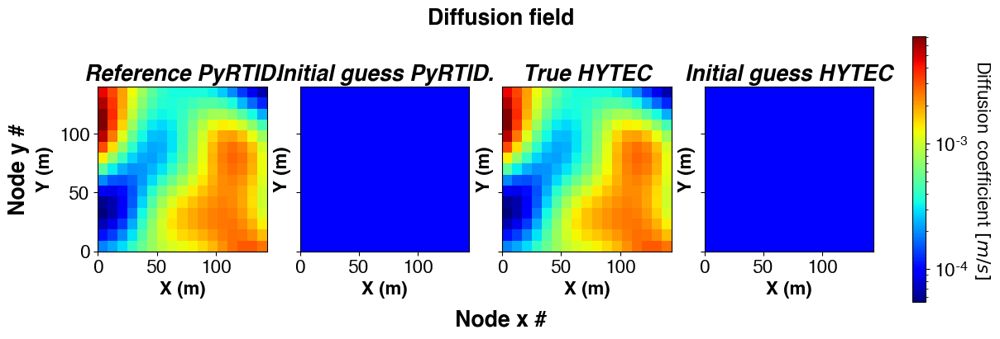

In [38]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 4)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax1-2", "ax1-3", "ax1-4"]], sharey=True, sharex=True
        )
    },
)
ngp.multi_imshow(
    axes=plotter.axes,
    fig=plotter.fig,
    data={
        "Reference PyRTID.": model_reference.tr_model.diffusion,
        "Initial guess PyRTID.": model_estimate.tr_model.diffusion,
        "True HYTEC": diff_true_hytec[:, :, 0, 0],
        "Initial guess HYTEC": diff_estimate_hytec[:, :, 0, 0],
    },
    cbar_title="Diffusion coefficient $[m/s]$",
    xlabel="X [m]",
    ylabel="Y [m]",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "norm": LogNorm(),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
)
plotter.subfigs["fig0"].suptitle("Diffusion field", fontweight="bold")
plotter.subfigs["fig0"].supxlabel("Node x #", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Node y #", fontweight="bold")

fname = "Diffusion_field_true_vs_estimated_hytec_and_dem"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Plot the initial concentration vs the final ones obtained with the demonstrator and HYTEC:

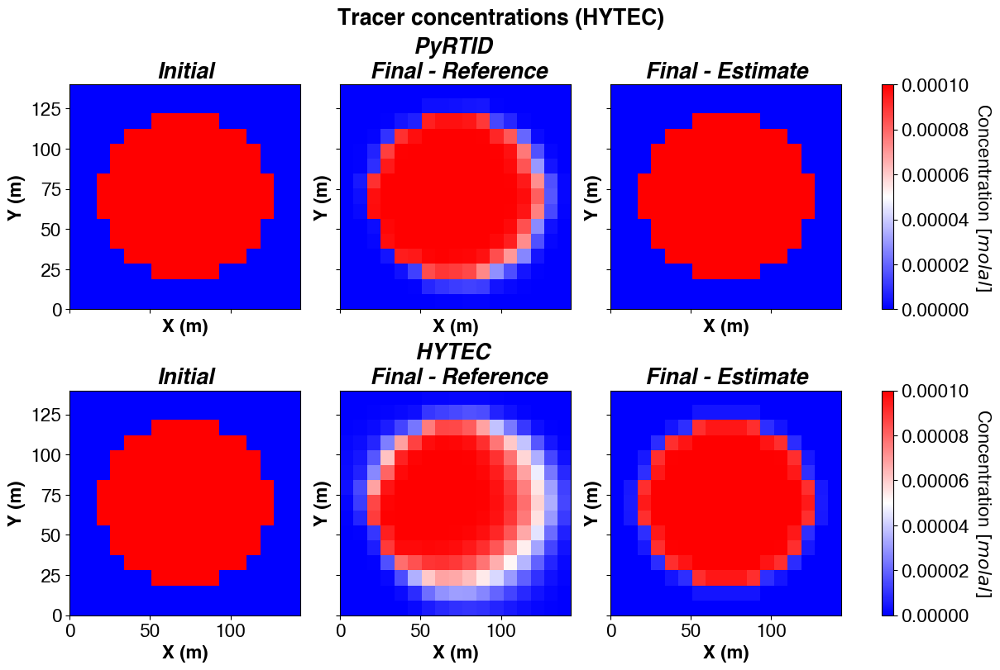

In [39]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax1-2", "ax1-3"], ["ax2-1", "ax2-2", "ax2-3"]],
            sharey=True,
            sharex=True,
        ),
    },
)
ngp.multi_imshow(
    axes=plotter.axes[0:3],
    fig=plotter.fig,
    data={
        "Initial": model_reference.tr_model.conc[:, :, 0],
        "PyRTID \n Final - Reference": model_reference.tr_model.conc[:, :, -1],
        "Final - Estimate": model_estimate.tr_model.conc[:, :, -1],
    },
    cbar_title="Concentration $[molal]$",
    xlabel="X [m]",
    ylabel="Y [m]",
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)
plotter.subfigs["fig0"].suptitle(
    "Tracer concentrations (demonstrator)", fontweight="bold"
)

ngp.multi_imshow(
    axes=plotter.axes[3:],
    fig=plotter.fig,
    data={
        "Initial": fwd_conc_true_hytec[:, :, 0, 0],
        "HYTEC \n Final - Reference": fwd_conc_true_hytec[:, :, 0, -1],
        "Final - Estimate": fwd_conc_estimate_hytec[:, :, 0, -1],
    },
    cbar_title="Concentration $[molal]$",
    xlabel="X [m]",
    ylabel="Y [m]",
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)

plotter.subfigs["fig0"].suptitle("Tracer concentrations (HYTEC)", fontweight="bold")

fname = "Tracers_concentrations_hytec_vs_dem"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

In [40]:
# Plot a concentration animation Here !
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (8, 6)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax1-2"], ["ax2-1", "ax2-2"]], sharey=True, sharex=True
        ),
    },
)
nb_frames = 30
plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2", "ax2-1", "ax2-2"],
    data={
        "PyRTID Reference": model_reference.tr_model.conc,
        "PyRTID Estimate": model_estimate.tr_model.conc,
        "HYTEC Reference": fwd_conc_true_hytec[:, :, 0, :],
        "HYTEC Estimate": fwd_conc_estimate_hytec[:, :, 0, :],
    },
    cbar_title="Concentration $[molal]$",
    xlabel="X [m]",
    ylabel="Y [m]",
    nb_frames=nb_frames,
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)
plotter.subfigs["fig0"].suptitle("Tracer concentration DEM.", fontweight="bold")


plotter.close()
plotter.animate(nb_frames=nb_frames)
# Save the animation locally on the computer
fname_html = fig_save_path.joinpath("fwd_conc_2d_animation.html")
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

# Extract the svg from the html file (for animation in Latex)
ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

/home/acollet/workspace/nested_grid_plotter/nested_grid_plotter/animated_plotter.py:58: UserWarning: The nb_frames (30) required exceeds the number of steps available (last dimension of arrays = 11)! Some images will be repeated.
  warnings.warn(
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


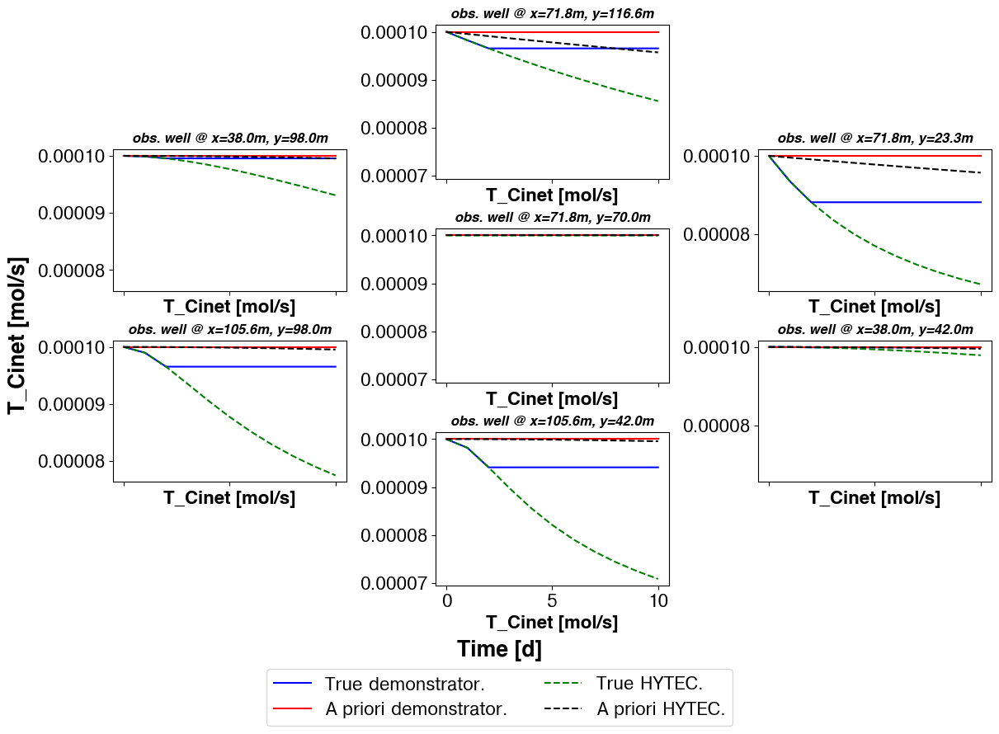

In [41]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(
    zip(obs_grid_locations, obs_plot_locations)
):
    x = (ix + 0.5) * dx
    y = (iy + 0.5) * dy
    # obs_well_name = f"obs. well @ node #{ix}-{jx} \n (x={x:.1f}m) (y={y:.1f}m)"
    obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"

    ax = plotter.ax_dict[ax_name]
    ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

    data = {
        "True demonstrator.": {
            "data": model_reference.tr_model.conc[ix, iy, :],
            "kwargs": {"c": "b"},
        },
        "A priori demonstrator.": {
            "data": model_estimate.tr_model.conc[ix, iy, :],
            "kwargs": {"c": "r"},
        },
        "True HYTEC.": {
            "data": fwd_conc_true_hytec[ix, iy, 0, :],
            "kwargs": {"c": "g", "linestyle": "--"},
        },
        "A priori HYTEC.": {
            "data": fwd_conc_estimate_hytec[ix, iy, 0, :],
            "kwargs": {"c": "k", "linestyle": "--"},
        },
    }

    for k, v in data.items():
        ax.plot(v["data"], **v["kwargs"], label=k)

    ax.set_xlabel("Time", fontweight="bold")
    ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

plotter.add_fig_legend(ncol=2)
plotter.fig.supxlabel("Time [d]", fontweight="bold")
plotter.fig.supylabel("T_Cinet [mol/s]", fontweight="bold")

fname = "T_Cinet_true_at_producers"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Function to add some noise to the "true" data

In [42]:
noise_std: float = 5e-7  # This is an absolute value
rng = np.random.default_rng(2021)


def get_white_noise(shape: Iterable[int]) -> NDArrayFloat:
    """
    Return the input with some added white noise.

    Note
    ----
    The parameters are hardcoded to be consistent in the notebook.
    Change the function directly.
    """
    mean_noise = 0.0  # mean
    return rng.normal(mean_noise, noise_std, np.array(shape))


# Generate a white noise
obs_noise: NDArrayFloat = get_white_noise(
    model_reference.tr_model.conc[
        obs_grid_locations.T[0], obs_grid_locations.T[1], :
    ].shape
)

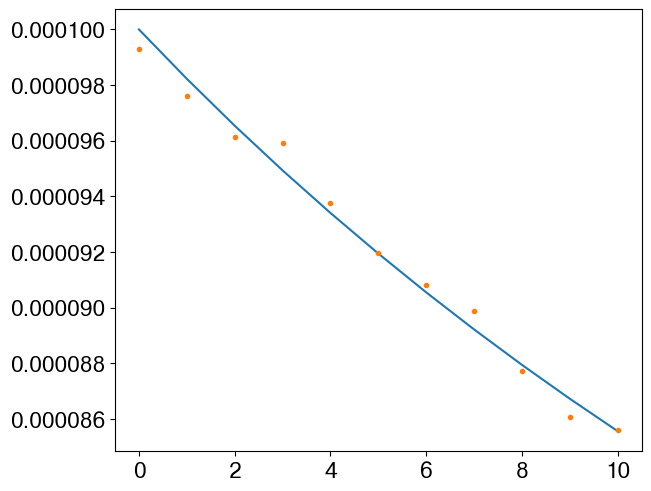

In [43]:
plt.plot(fwd_conc_true_hytec[ix, iy, 0, :])
plt.plot(
    fwd_conc_true_hytec[ix, iy, 0, :] + obs_noise[-1], marker=".", linestyle="none"
)

- Compute the objective function

In [44]:
fun = 0
for i, (x, y) in enumerate(obs_grid_locations):
    ix = int(x // dx)
    iy = int(y // dy)
    fun += np.sum(
        np.square(
            (
                fwd_conc_true_hytec[ix, iy, 0, :]
                + obs_noise[i]
                - fwd_conc_estimate_hytec[ix, iy, 0, :]
            )
            / noise_std
        )
    )
print("J0 = ", 0.5 * fun)

J0 =  35.80055035385473


## Inversion

- Compute the first gradient for the demonstrator

In [45]:
param = dminv.AdjustableParameter(
    name=dminv.ParameterName.DIFFUSION,
    lbounds=2e-5,
    ubounds=5e-3,
    preconditioner=dminv.LogTransform(),
)

from typing import Dict  # Just for linting

observables = []
for i, (x, y) in enumerate(obs_grid_locations):
    ix = int(x // dx)
    iy = int(y // dy)
    vals = model_reference.tr_model.conc[ix, iy, :] + obs_noise[i]
    timesteps = np.arange(vals.shape[0])
    observables.append(
        dminv.Observable(
            state_variable=dminv.StateVariable.CONCENTRATION,
            location=(slice(ix, ix + 1, 1), slice(iy, iy + 1, 1)),
            timesteps=timesteps,
            values=vals,
            uncertainties=noise_std,
        )
    )


# Create an executor to keep track of the adjoint model
solver_config = dminv.ScipySolverConfig(
    solver_name="L-BFGS-B",
    solver_options={"maxfun": 20, "maxiter": 20, "ftol": 1e-4, "gtol": 1e-4},
    is_check_gradient=True,
)
model_adjusted = copy.deepcopy(model_estimate)
inverse_model = dminv.InverseModel(param, observables)
executor = dminv.ScipyInversionExecutor(model_adjusted, inverse_model, solver_config)

executor.eval_scaled_loss(param.preconditioner(param.values))

is_grad_ok = executor.is_adjoint_gradient_correct()

INFO:root:- Running forward model # 1
INFO:root:- Run # 1 over
INFO:root:Loss (obs fit)        = 35.80047644110916
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 0.027932589155481594
INFO:root:Loss (scaled)         = 1.0



In [46]:
logging.info(f"Is the gradient correct: {is_grad_ok}")

INFO:root:Is the gradient correct: True


Running with HYTEC require to add some parameters to the htc:

In [47]:
# 1) Copy the "estimate" simulation, with a flat diffusion field
simu_inverse = copy.deepcopy(simu_estimate)
simu_inverse.update_root_and_name(new_root="simu_inverse", new_name="simu_inverse")

# 2) Add the observation wells
for count, (ix, iy) in enumerate(obs_grid_locations):
    x = (ix + 0.5) * model_true.dx
    y = (iy + 0.5) * model_true.dy
    name = f"well_{ix}_{iy}"
    zone = HytecZone(name, htc_path=simu_inverse.htc_file_path)
    zone.geometries.append(f"rectangle {ix},{iy}, {model_true.dx/2},{model_true.dy/2}")
    if fwd_conc_true_hytec[ix, iy, 0, 0] < 1e-5:
        zone.geochem = "chem_base"
    else:
        zone.geochem = "chem_center"

    # Add the observables for the area
    obs = Observable(
        zone_name=zone.name,
        column_index=3,
        root_relative_path=f"observables/well{count + 1}_o.dat",
        root_path=simu_inverse.root,
        type=ObservationType.GRID,
    )

    vals = fwd_conc_true_hytec[ix, iy, 0, :]
    odata = pd.DataFrame(
        data={
            "time [s]": flux_sample_times,
            "node-number": indices_to_hytec_node_number(
                ix, nx=model_true.nx - 1, iy=iy
            ),
            "T [mol/kg]": vals,
        }
    )
    obs.handler.update_data(odata)
    zone.observables.append(obs)

    simu_inverse.handlers.htc.zones_dict[name] = zone

# 3) Update the htc file with some options
simu_inverse.handlers.htc.optimization = "enabled"
simu_inverse.handlers.htc.optimization_solver = OptimizationSolverConfig(
    solver_name="lbfgsb",
    max_number_iterations=20,
    max_number_fwd_model_eval=150,
    max_number_gradient_eval=20,
    max_number_hessian_eval=0,
    objfun_threshold=1e-1,
    objfun_min_change=0.0,
    param_min_change=0.0,
    gradient_min_norm=0.0,
    hessian_max_norm=0.0,
    grad_history_size=5,
    adjoint_state="enabled",
    fd_gradient_check="initial",
)
simu_inverse.handlers.htc.adjusted_parameters_dict = {
    "diffusion": AdjustedParameterConfig(
        name="diffusion", lbounds=1e-7, ubounds=1e-2, preconditioner="logarithmic"
    )
}
simu_inverse.handlers.htc.adjoint_sampling = (
    1000  # number of samples on the adjoint variables
)

# 4)Write the input files
simu_inverse.write_input_files()

# 5) Run HYTEC
runner.run(simu_inverse)

NameError: name 'model_true' is not defined

- Read the results

In [ ]:
# 7) Read results
simu_inverse.read_hytec_results()

- Extract the adjoint variables computed for the first gradient

In [ ]:
print(f"columns = {simu_inverse.handlers.results.optim_res.adjoint_var_columns}")

columns = ['timestep', 'Zones', 'adjoint-variable{H[+]} [m]', 'adjoint-variable{T} [m]', 'x-distance', 'y-distance']


In [ ]:
adj_conc_hytec = simu_inverse.handlers.results.extract_field_from_adj_var_res(
    field="adjoint-variable{T} [m]", nx=nx, ny=ny
)
adj_conc_hytec.shape

(20, 20, 1, 1001)

- Plot the adjoint variables

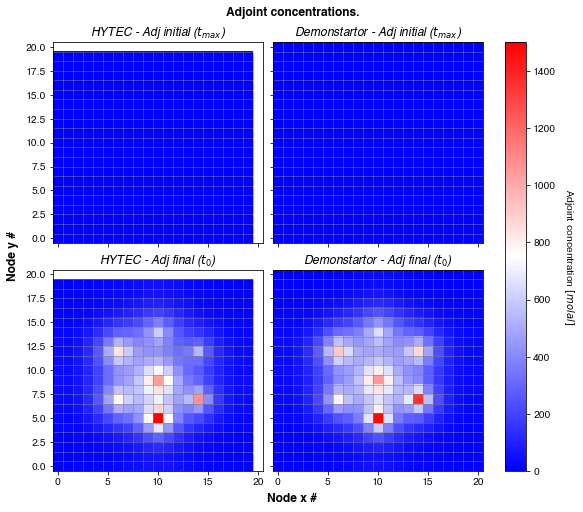

In [ ]:
# Plot a concentration animation Here !
plotter = FieldPlotter(
    fig_params={"constrained_layout": True, "figsize": (8, 7)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax1-2"], ["ax2-1", "ax2-2"]], sharey=True, sharex=True
        ),
    },
)
timestep = 0
plotter.plot_2d_field(
    ax_names=["ax1-1", "ax1-2", "ax2-1", "ax2-2"],
    data={
        "HYTEC - Adj initial ($t_{max}$)": adj_conc_hytec[:, :, 0, -1],
        "Demonstartor - Adj initial ($t_{max}$)": executor.rt_solver.inverse_model.adj_conc[
            :, :, -1
        ],
        "HYTEC - Adj final ($t_{0}$)": adj_conc_hytec[:, :, 0, 0],
        "Demonstartor - Adj final ($t_{0}$)": executor.rt_solver.inverse_model.adj_conc[
            :, :, 0
        ],
    },
    cbar_title="Adjoint concentration $[molal]$",
    is_add_grid=True,
)
plotter.subfigs["fig0"].suptitle("Adjoint concentrations.", fontweight="bold")
plotter.subfigs["fig0"].supxlabel("Node x #", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Node y #", fontweight="bold")

fname = "adj_t0_tmax_vs_fd_hytec_vs_dem"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

In [ ]:
# Plot a concentration animation Here !
plotter = FieldPlotter(
    fig_params={"constrained_layout": True, "figsize": (8, 4)},
    subfigs_params={"nrows": 1},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True),
    },
)
nb_frames = 30
plotter.plot_2d_animated_field(
    ax_names=["ax1-1", "ax1-2"],
    data={
        "HYTEC": np.flip(adj_conc_hytec[:, :, 0, :-1], axis=-1),
        "Demonstartor (python)": executor.rt_solver.inverse_model.adj_conc[:, :, ::-1],
    },
    cbar_title="Adjoint concentration $[molal]$",
    nb_frames=nb_frames,
    is_add_grid=True,
)
plotter.subfigs["fig0"].suptitle("Adjoint concentrations.", fontweight="bold")
plotter.subfigs["fig0"].supxlabel("Node x #", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Node y #", fontweight="bold")

plotter.close()
plotter.animate(nb_frames=nb_frames)
# Save the animation locally on the computer
fname_html = fig_save_path.joinpath("adj_conc_2d_animation.html")
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(fname_html, writer=writer)

# Extract the svg from the html file (for animation in Latex)
ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

### Gradient comparison

Reading the gradient

In [ ]:
adjoint_gradients = simu_inverse.handlers.results.optim_res.adjoint_gradients[0][
    "value"
]
fd_gradients = simu_inverse.handlers.results.optim_res.adjoint_gradients[0]["value"]

adjoint_gradients.to_numpy().reshape(ny, nx)
fd_gradients.to_numpy().reshape(ny, nx)

array([[ 1.31282e-08, -4.96491e-08,  5.34212e-08, -5.62307e-07,
        -1.41720e-06, -2.91762e-06, -5.02057e-06, -6.79094e-06,
        -6.08012e-06, -3.52392e-06, -3.59731e-06, -6.33872e-06,
        -8.50948e-06, -7.18650e-06, -4.24771e-06, -1.95273e-06,
        -7.26231e-07, -2.10676e-07, -4.37424e-08,  3.12879e-14],
       [-3.61905e-08, -2.91057e-07, -1.45965e-07, -7.17080e-07,
        -2.93110e-06, -9.55030e-06, -2.44270e-05, -5.36421e-05,
        -1.20084e-04, -2.20055e-04, -2.92212e-04, -1.94230e-04,
        -8.35353e-05, -3.08735e-05, -1.05023e-05, -3.15604e-06,
        -8.04179e-07, -1.72703e-07, -7.24065e-08, -7.36510e-08],
       [-2.29506e-07, -1.79771e-07, -9.20782e-07, -5.70376e-06,
        -2.60074e-05, -8.78249e-05, -2.17669e-04, -4.34370e-04,
        -9.75543e-04, -1.82699e-03, -2.65336e-03, -1.63336e-03,
        -6.44596e-04, -2.38355e-04, -8.41867e-05, -2.51232e-05,
        -5.89800e-06, -1.04621e-06, -2.50147e-07, -3.44371e-07],
       [-7.28230e-07, -9.20255e-07, -

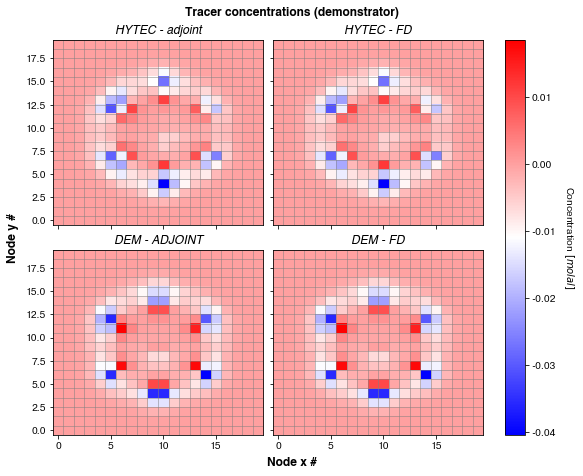

In [ ]:
plotter = FieldPlotter(
    fig_params={"constrained_layout": True, "figsize": (8, 6.5)},
    # subfigs_params={"nrows": 2, "ncols": 2},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax1-2"], ["ax2-1", "ax2-2"]], sharey=True, sharex=True
        ),
    },
)

plotter.plot_2d_field(
    ax_names=["ax1-1", "ax1-2", "ax2-1", "ax2-2"],
    data={
        "HYTEC - adjoint": adjoint_gradients.to_numpy().reshape(ny, nx).T,
        "HYTEC - FD": fd_gradients.to_numpy().reshape(ny, nx).T,
        "DEM - ADJOINT": param.grad_adj_history[0].reshape(nx, ny),
        "DEM - FD": param.grad_fd_history[0].reshape(nx, ny),
    },
    cbar_title="Concentration $[molal]$",
    is_add_grid=True,
)
plotter.subfigs["fig0"].suptitle(
    "Tracer concentrations (demonstrator)", fontweight="bold"
)
plotter.subfigs["fig0"].supxlabel("Node x #", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Node y #", fontweight="bold")

fname = "1st_gradient_adj_vs_fd_hytec_vs_dem"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

# Full optimization

In [ ]:
# 1) Copy the "estimate" simulation, with a flat diffusion field
simu_inverse_full = copy.deepcopy(simu_inverse)
simu_inverse_full.update_root_and_name(
    new_root="simu_inverse_full", new_name="simu_inverse_full"
)

# 2) Update the htc file with some options
simu_inverse_full.handlers.htc.optimization = "enabled"
simu_inverse_full.handlers.htc.optimization_solver = OptimizationSolverConfig(
    solver_name="lbfgsb",
    max_number_iterations=30,
    max_number_fwd_model_eval=150,
    max_number_gradient_eval=30,
    max_number_hessian_eval=1,
    objfun_threshold=1e-1,
    objfun_min_change=0.0,
    param_min_change=0.0,
    gradient_min_norm=0.0,
    hessian_max_norm=0.0,
    grad_history_size=5,
    adjoint_state="enabled",
    fd_gradient_check="disabled",
)
simu_inverse_full.handlers.htc.adjusted_parameters_dict = {
    "diffusion": AdjustedParameterConfig(
        name="diffusion", lbounds=1e-7, ubounds=1e-2, preconditioner="logarithmic"
    )
}
simu_inverse_full.handlers.htc.adjoint_sampling = (
    1000  # number of samples on the adjoint variables
)

# 4)Write the input files
simu_inverse_full.write_input_files()

# 5) Run HYTEC
runner.run(simu_inverse_full)

The job is over ! Elapsed time = 0:04:16.111382


True

In [ ]:
# 6) Read results
simu_inverse_full.read_hytec_results()
try:
    simu_inverse_full.read_hytec_results()  # This fails if not results have been written
except FileNotFoundError as e:
    print("Check that HYTEC has been compiled with EIGEN and OPT_MODULE ON !")
    raise e

- Get the concentrations

In [ ]:
# Get the results on a 3D grid with the last dimension as time step
fwd_conc_inversed_hytec = (
    simu_inverse_full.handlers.results.extract_field_from_grid_res(
        field="T [mol/kg]", nx=nx, ny=ny
    )
)
# Need to do a trick to compensate a current bug in HYTEC
fwd_conc_inversed_hytec[:, :, :, 0] = fwd_conc_true_hytec[:, :, :, 0]

- Get the gradients

In [ ]:
simu_inverse_full.handlers.results.optim_res.adjoint_gradients[0].columns

adjoint_gradients = simu_inverse_full.handlers.results.get_adjoint_gradient(
    "diffusion", nx=nx, ny=ny
)
fd_gradients = simu_inverse_full.handlers.results.get_fd_gradient(
    "diffusion", nx=nx, ny=ny
)
adjusted_diffusion = simu_inverse_full.handlers.results.get_adjusted_parameter_field(
    "diffusion", nx=nx, ny=ny
)
obj_funs = simu_inverse_full.handlers.results.optim_res.obj_funs

In [ ]:
adjusted_diffusion.shape

(20, 20, 1, 32)

In [ ]:
adjoint_gradients.shape

(20, 20, 1, 31)

In [ ]:
obj_funs.shape

(32,)

- Align gradients and objective functions: Because of the construction in HYTEC, unless I am mistaken, the objective function and fitted parameter vectors match exactly. On the other hand, there is an uncontrolled mismatch with the gradients due to the solver which, depending on its needs, may have to apply several objective functions in a row or several gradients. This function makes sure that the two match for a good rendering of the animations.

In [ ]:
grad_index = 0
grad_obj_funs = (
    simu_inverse_full.handlers.results.optim_res.obj_funs_matching_adjoint_gradients
)

# Example: [3, 4, 4, 5, 7, 8, 8, 9]

aligned_adjoint_gradients = np.empty(
    (*adjoint_gradients[:, :, :, 0].shape, obj_funs.size)
)
aligned_adjoint_gradients.fill(np.nan)

previous_index: int = -1
for i, index in enumerate(grad_obj_funs):
    if index == previous_index:
        continue
    if index > obj_funs.size:
        continue
    previous_index = index
    aligned_adjoint_gradients[:, :, :, index - 1] = adjoint_gradients[:, :, :, i]

# Fill the first missing gradients
# Gradients 1 and 2 in the example
for i2 in range(grad_obj_funs[0] - 1):
    aligned_adjoint_gradients[:, :, :, i2] = aligned_adjoint_gradients[
        :, :, :, grad_obj_funs[0]
    ]

In [ ]:
aligned_adjoint_gradients.shape

(20, 20, 1, 32)

- Get the observations and the predictions vector to plot it against each others

In [ ]:
obs_vector = simu_inverse_full.get_observation_vector()
pred_vector = simu_inverse_full.get_results_matching_obs_vector(
    simu_inverse_full.get_observables()
)

In [ ]:
model_true.D[6, :]

array([0.00091789, 0.00101572, 0.00104595, 0.00095924, 0.00077547,
       0.00057036, 0.0004069 , 0.00030323, 0.0002504 , 0.00023515,
       0.00024831, 0.00028316, 0.00033057, 0.00037569, 0.00040085,
       0.0003944 , 0.00035768, 0.00030315, 0.00024615, 0.00019775])

In [ ]:
np.transpose(np.repeat(model_true.D[None, :, :], nb_frames, axis=0), axes=(1, 2, 0))[
    6, :, 0
]

array([0.00091789, 0.00101572, 0.00104595, 0.00095924, 0.00077547,
       0.00057036, 0.0004069 , 0.00030323, 0.0002504 , 0.00023515,
       0.00024831, 0.00028316, 0.00033057, 0.00037569, 0.00040085,
       0.0003944 , 0.00035768, 0.00030315, 0.00024615, 0.00019775])

In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (13, 8)},
    subfigs_params={"nrows": 2, "ncols": 1},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2", "ax1-3"]], sharex=True, sharey=True),
        "fig1": dict(mosaic=[["ax2-1", "ax2-2"]]),
    },
)

# 1 frame per solver iteration
nb_frames: int = obj_funs.shape[0]

# 1) Gradient evolution
plotter.plot_2d_animated(
    ax_names=["ax1-1"],
    data={
        "Gradient": aligned_adjoint_gradients[:, :, 0, :],
    },
    is_add_grid=True,
    # title="Gradient",
    xlabel="Node x#",
    ylabel="Node y#",
    nb_frames=nb_frames,
    is_symmetric_cbar=True,
)

# 2) Parameter evolution
plotter.plot_2d_animated(
    ax_names=["ax1-2", "ax1-3"],
    data={
        "Diffusion inverted": adjusted_diffusion[:, :, 0, :],
        "Diffusion true": np.transpose(
            np.repeat(model_true.D[None, :, :], nb_frames, axis=0), axes=(1, 2, 0)
        ),
    },
    is_add_grid=True,
    # title="Gradient",
    xlabel="Node x#",
    ylabel="Node y#",
    nb_frames=nb_frames,
    cbar_title="Diffusion coefficient $[m/s]$",
    imshow_kwargs={"cmap": plt.get_cmap("jet"), "norm": LogNorm()},
)

# 3) Objective function
vals = obj_funs
obj_fun_vals = np.full((nb_frames, len(vals)), fill_value=np.nan)
for i in range(len(vals)):
    obj_fun_vals[i, : i + 1] = vals[: i + 1]

plotter.animated_multi_plot(
    ax_name="ax2-1",
    nb_frames=nb_frames,
    data={
        "Obj fun": {"data": obj_fun_vals.T, "kwargs": {"c": "r", "linestyle": "--"}},
    },
    title="Objective function",
    xlabel="Iteration #",
)
plotter.ax_dict["ax2-1"].set_yscale("log")

# NOTE: 2022/09/07 -> need to find a way to make that less heavy
# 4) Observation vs predicted values

# plot_observed_vs_simulated(
#     plotter.ax_dict["ax2-2"],
#     obs_vector=simu_inverse_full.get_observation_vector() * 1000,
#     pred_vector=simu_inverse_full.get_results_matching_obs_vector(
#         simu_inverse_full.get_observables()
#     )
#     * 1000,
#     pred_vector_initial=simu_estimate.get_results_matching_obs_vector(
#         simu_inverse_full.get_observables()
#     )
#     * 1000,
#     unit="$mmol/s^{-1}$",
# )

plotter.close()
plotter.animate(nb_frames=nb_frames)
# Save the animation locally on the computer
fname_html = fig_save_path.joinpath("m_j_g_animation.html")
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(fname_html, writer=writer)

# Extract the svg from the html file (for animation in Latex)
ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

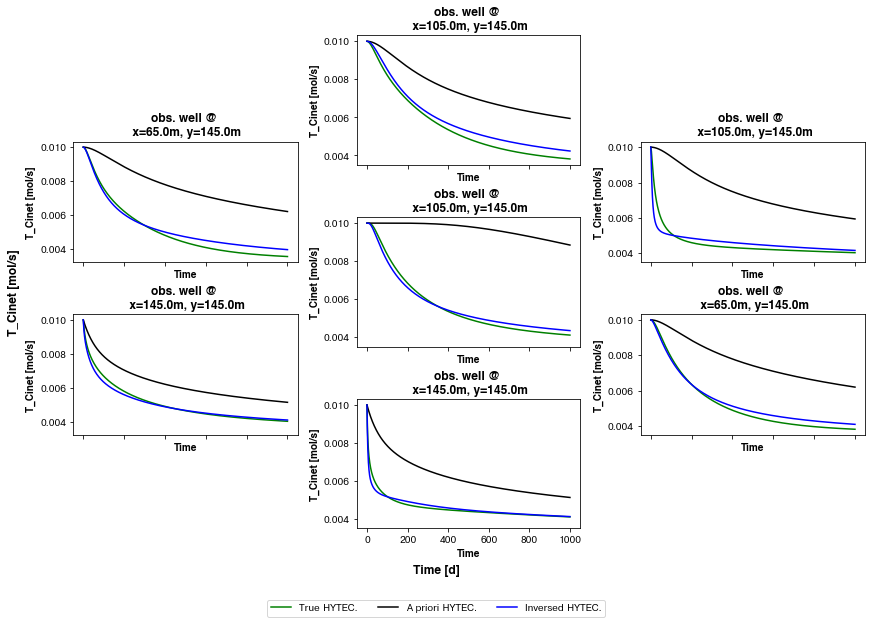

In [ ]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = FieldPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(
    zip(obs_grid_locations, obs_plot_locations)
):
    x = (ix + 0.5) * model_true.dx
    y = (jx + 0.5) * model_true.dy
    # obs_well_name = f"obs. well @ node #{ix}-{jx} \n (x={x:.1f}m) (y={y:.1f}m)"
    obs_well_name = f"obs. well @ \n x={x:.1f}m, y={y:.1f}m"

    plotter.plot_1d_field(
        ax_name=ax_name,
        title=obs_well_name,
        data={
            "True HYTEC.": {
                "data": fwd_conc_true_hytec[ix, iy, 0, :],
                "kwargs": {"c": "g"},
            },
            "A priori HYTEC.": {
                "data": fwd_conc_estimate_hytec[ix, iy, 0, :],
                "kwargs": {"c": "k"},
            },
            "inverted HYTEC.": {
                "data": fwd_conc_inversed_hytec[ix, iy, 0, :],
                "kwargs": {"c": "b"},
            },
        },
        xlabel="Time",
        ylabel="T_Cinet [mol/s]",
    )

plotter.add_fig_legend(ncol=3)
plotter.fig.supxlabel("Time [d]", fontweight="bold")
plotter.fig.supylabel("T_Cinet [mol/s]", fontweight="bold")

fname = "T_Cinet_post_inversion_at_producers"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)